<a href="https://colab.research.google.com/github/michaelnasevich/fastbook/blob/master/Full_Vision_Model_Draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 32.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 16.1.0 which is incom

In [2]:
!pip install -Uqq duckduckgo-images-api

In [3]:
from fastbook import search_images_ddg

In [4]:
from fastcore.all import *

In [5]:
def search_images(search_term, max_images=10):
    print(f"Searching for '{search_term}'")
    return L(ddg_images(search_term, max_results=max_images)).itemgot('image') # edit to the code given, utilizing ddg_images instead now

In [6]:
team_names = ["Kansas City Royals", "Yankees", "Astros", "St Louis Cardinals", "Mets", "San Francisco Giants", "White Sox", "Blue Jays", "Mariners", "Cubs", "Marlins", "Diamondbacks", "Twins","Red Sox", "Rangers", "Braves", "Dodgers", "Guardians", "Rays", "Angels", "Brewers","Phillies", "Padres", "Tigers", "Orioles", "Athletics","Reds","Nationals","Rockies"]
for name in team_names:
    search_term = f"{name} Jersey Photos"
    print(search_term)

Kansas City Royals Jersey Photos
Yankees Jersey Photos
Astros Jersey Photos
St Louis Cardinals Jersey Photos
Mets Jersey Photos
San Francisco Giants Jersey Photos
White Sox Jersey Photos
Blue Jays Jersey Photos
Mariners Jersey Photos
Cubs Jersey Photos
Marlins Jersey Photos
Diamondbacks Jersey Photos
Twins Jersey Photos
Red Sox Jersey Photos
Rangers Jersey Photos
Braves Jersey Photos
Dodgers Jersey Photos
Guardians Jersey Photos
Rays Jersey Photos
Angels Jersey Photos
Brewers Jersey Photos
Phillies Jersey Photos
Padres Jersey Photos
Tigers Jersey Photos
Orioles Jersey Photos
Athletics Jersey Photos
Reds Jersey Photos
Nationals Jersey Photos
Rockies Jersey Photos


In [7]:
urls = search_images_ddg(f'{search_term}')
urls[0]

'https://i.pinimg.com/originals/7a/d8/6a/7ad86a7c7542c8fd7c0665a59735a14c.jpg'

In [8]:
type(urls[0])

str

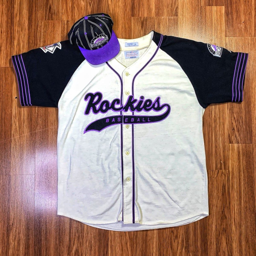

In [9]:
from fastdownload import download_url
dest = f'{search_term}.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

In [34]:
!pip install pyheif  # Install library to handle HEIC images
from PIL import Image
import pyheif

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 13.0 MB/s eta 0:00:00


In [39]:
def resize_image(fn, src, dest, max_size, n_channels=None, ext=None, img_format=None, resample=Image.BILINEAR, resume=False, **kwargs):
    "Resize a single image `fn` to `dest`"
    dest_fname = dest/fn.name
    if dest_fname.exists() and resume: return
    if ext is not None: dest_fname=dest_fname.with_suffix(ext)
    if not fn.exists(): return

    # Handle HEIC images
    if fn.suffix == '.heic':
        heif_file = pyheif.read(fn)
        image = Image.frombytes(
            heif_file.mode,
            heif_file.size,
            heif_file.data,
            "raw",
            heif_file.mode,
            heif_file.stride,
        )
    else:
        image = Image.open(fn)

    image = image.convert(mode='RGB') # Ensure image is in RGB format
    sz = image.size
    if max_size is not None and (sz[0] > max_size or sz[1] > max_size):
        new_sz = resize_to(sz, max_size=max_size)
        image = image.resize(new_sz, resample=resample)
    if n_channels is not None: image = image.convert(f'RGB' if n_channels==3 else 'L')
    image.save(dest_fname, img_format, **kwargs)

    # Explicitly set the format for HEIC images
    if fn.suffix == '.heic':
        dest_fname = dest_fname.with_suffix('.jpg')  # Change extension to a supported format

    image.save(dest_fname, img_format, **kwargs)  # Now PIL knows how to handle it

In [41]:

path = Path('MLB_teams')
from time import sleep

for o in team_names:
    print(o)
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images_ddg(f'{o} Jersey Photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images_ddg(f'{o} Home Jersey Photo'))
    sleep(10)
    download_images(dest, urls=search_images_ddg(f'{o} Away Jersey Photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

Kansas City Royals
Yankees
Astros


ValueError: unknown file extension: .heic

In [37]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

35

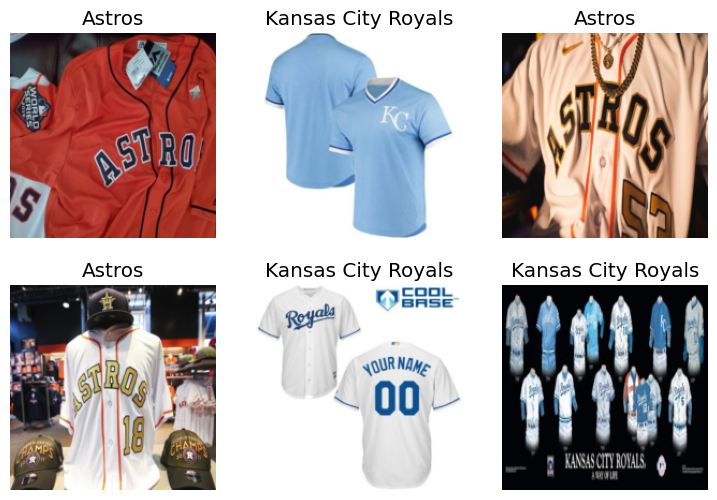

In [38]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=43),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

dls.show_batch(max_n=6)

In [14]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:02<00:00, 18.8MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.077897,0.305313,0.094488,02:58


epoch,train_loss,valid_loss,error_rate,time
0,0.355834,0.246253,0.074803,04:14
1,0.180158,0.189591,0.051181,04:17
2,0.110471,0.171447,0.047244,04:14


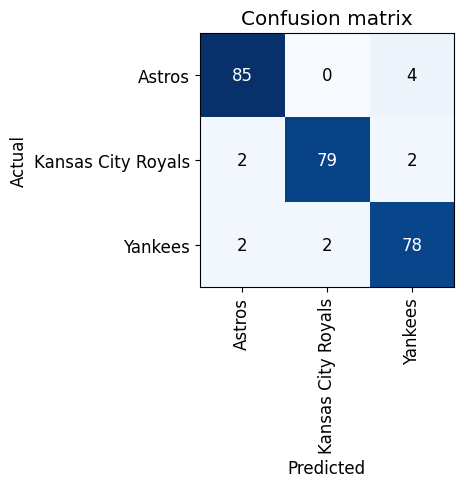

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

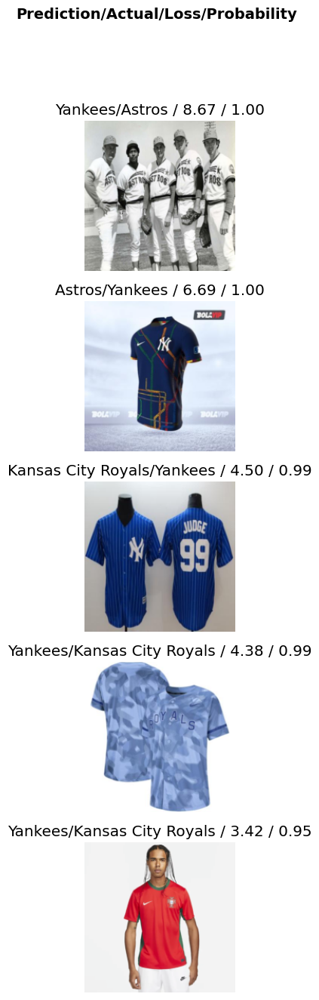

In [20]:
interp.plot_top_losses(5, nrows=5)

In [31]:
from fastai.vision.widgets import *

In [32]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [33]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
torch.save(learner.model, "/path/to/model.pt") # or save it's state_dict, better option
# model = torch.load("/path/to/model.pt")